<a href="https://colab.research.google.com/github/AqsaHerryPrastyo/PCVK/blob/main/Week11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [62]:
# Import library yang dibutuhkan
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
import os

# Mengakses Google Drive
from google.colab import drive
drive.mount('/content/drive')

# --- PENTING ---
# Sesuaikan base_path ini dengan lokasi folder gambar Anda di Google Drive
# Contoh: '/content/drive/MyDrive/Kuliah/PCVK/Images/'
# Anda bisa melihat path di modul, misal: [cite: 331, 491]
base_path = '/content/drive/MyDrive/Image/ObjectDetection'

# Path untuk folder praktikum (sesuai modul)
facedet_path = os.path.join(base_path, 'facedet')
haarcascades_path = '/content/drive/MyDrive/Image/haarcascades'

# Pastikan folder ada
print(f"Folder facedet: {os.path.exists(facedet_path)}")
print(f"Folder haarcascades: {os.path.exists(haarcascades_path)}")

# Fungsi helper untuk menampilkan gambar di Colab
def show_image(img, cmap='gray'):
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111)
    ax.imshow(img, cmap=cmap)
    plt.show()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Folder facedet: True
Folder haarcascades: True


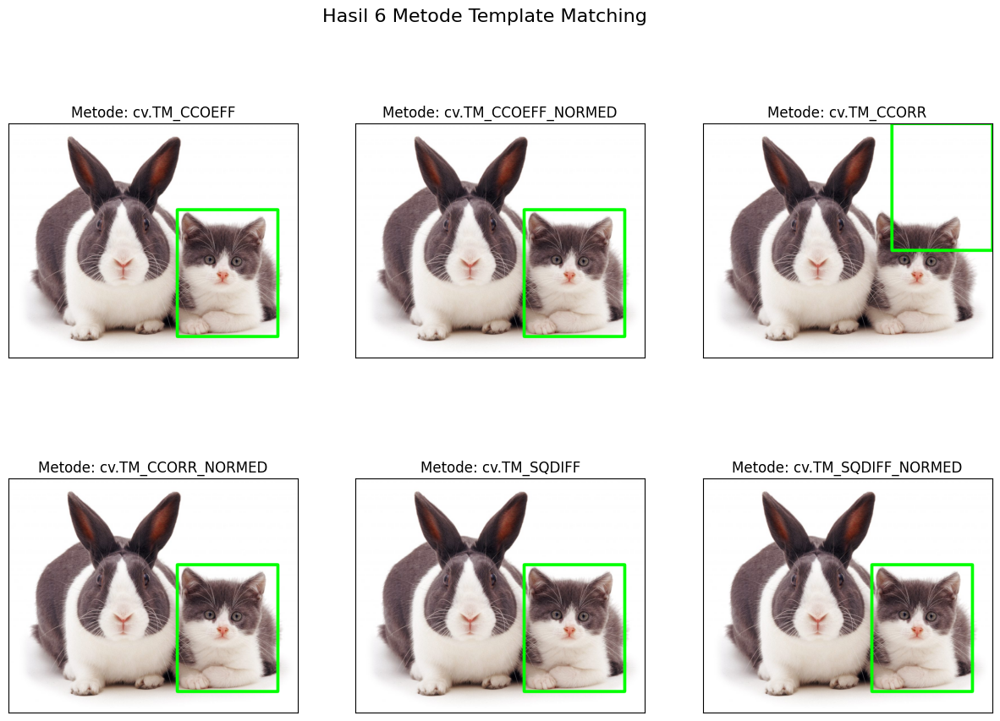

In [ ]:
# 1. Muat gambar
img_rgb = plt.imread(os.path.join(base_path, 'cats_and_bunnies.jpg'))
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)

# (Pastikan nama file template sesuai dengan yang Anda miliki)
template = plt.imread(os.path.join(base_path, 'cat2_templatejpg.jpg'))
template_gray = cv.cvtColor(template, cv.COLOR_BGR2GRAY)
w, h = template_gray.shape[::-1]

# 2. Daftar 6 metode [cite: 539-545]
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

# 3. Loop dan terapkan setiap metode
plt.figure(figsize=(15, 10))
for i, meth_name in enumerate(methods):
    img_draw = img_rgb.copy()
    method = eval(meth_name) # Mengubah string menjadi fungsi, misal 'cv.TM_CCOEFF'

    # Terapkan Template Matching [cite: 536]
    res = cv.matchTemplate(img_gray, template_gray, method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)

    # Metode SQDIFF menggunakan nilai minimum sebagai kecocokan terbaik
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc

    bottom_right = (top_left[0] + w, top_left[1] + h)

    # Gambar kotak
    cv.rectangle(img_draw, top_left, bottom_right, (0, 255, 0), 10)

    # Tampilkan hasil
    plt.subplot(2, 3, i+1)
    plt.imshow(img_draw)
    plt.title(f'Metode: {meth_name}'), plt.xticks([]), plt.yticks([])

plt.suptitle('Hasil 6 Metode Template Matching', fontsize=16)
plt.show()

## Tugas 3: Multiple Object Template Matching

Ditemukan 201 deteksi mentah (dari rotasi + flip) sebelum NMS.
Ditemukan 6 obyek yang cocok setelah NMS (rotasi + flip).


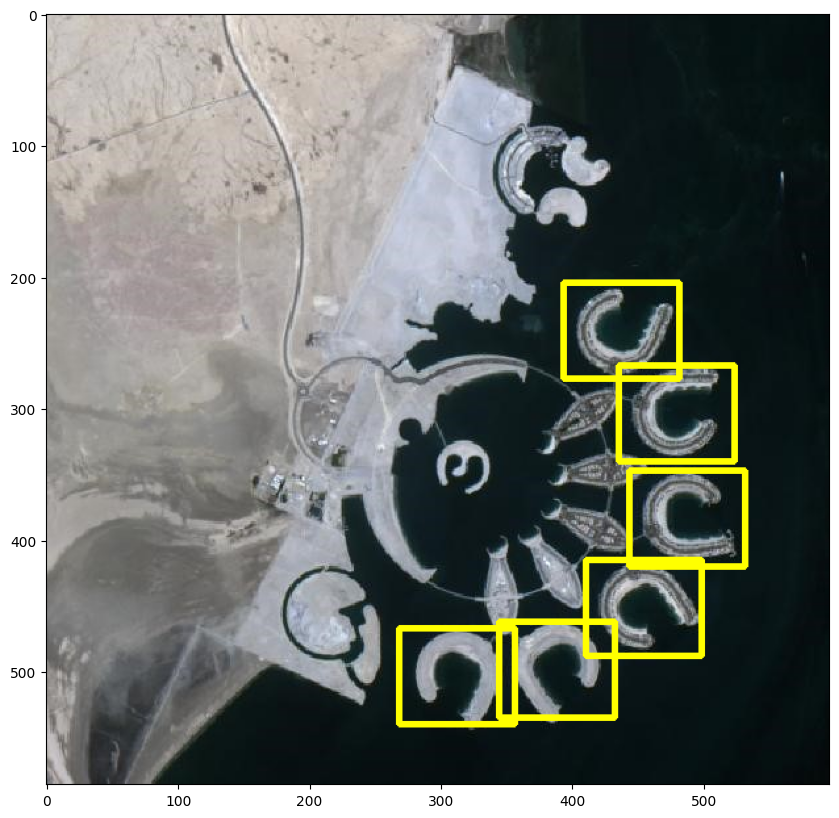

In [ ]:
# Fungsi helper untuk rotasi (tidak berubah)
def rotate_template(image, angle):
    h, w = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv.warpAffine(image, M, (w, h))
    return rotated

# --- Langkah Utama ---

# 1. Muat gambar
img_rgb = plt.imread(os.path.join(base_path, 'bahrain.jpg'))
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
img_draw = img_rgb.copy()

template_orig = plt.imread(os.path.join(base_path, 'bahrain-template.jpg'))
template_gray = cv.cvtColor(template_orig, cv.COLOR_BGR2GRAY)
w, h = template_gray.shape[::-1]

# 2. BUAT VERSI FLIP DARI TEMPLATE
# Parameter 1 = flip horizontal (kiri-kanan)
# Parameter 0 = flip vertikal (atas-bawah)
template_flipped = cv.flip(template_gray, 1)

# Buat list berisi template dasar kita
base_templates = [template_gray, template_flipped]

# 3. Siapkan list untuk SEMUA deteksi
all_rectangles = []
threshold = 0.75 # Kita bisa pakai threshold yang sama

# 4. LOOPING UNTUK FLIP (Loop Terluar)
# Loop ini akan berjalan 2 kali: sekali untuk template_gray, sekali untuk template_flipped
for base_template in base_templates:

    # 5. LOOPING UNTUK ROTASI (Loop Terdalam)
    # Loop ini akan menjalankan deteksi untuk setiap 15 derajat
    for angle in np.arange(0, 360, 15):

        # a. Rotasi template (baik yg ori maupun yg flip)
        rotated_template = rotate_template(base_template, angle)

        # b. Jalankan matchTemplate
        res = cv.matchTemplate(img_gray, rotated_template, cv.TM_CCOEFF_NORMED)

        # c. Dapatkan lokasi yang cocok
        loc = np.where(res >= threshold)

        # d. Tambahkan semua kotak yang cocok ke list utama
        for pt in zip(*loc[::-1]):
            all_rectangles.append([int(pt[0]), int(pt[1]), int(w), int(h)])

# 6. Debug: Lihat berapa banyak deteksi mentah yang kita dapat
# Angka ini akan jauh lebih besar sekarang
print(f"Ditemukan {len(all_rectangles)} deteksi mentah (dari rotasi + flip) sebelum NMS.")

# 7. Terapkan NMS (cv.groupRectangles) untuk membersihkan semua hasil
grouped_rects, weights = cv.groupRectangles(all_rectangles, groupThreshold=1, eps=0.1)

# 8. Gambar kotak-kotak final
for (x, y, w, h) in grouped_rects:
    cv.rectangle(img_draw, (x, y), (x + w, y + h), (255, 255, 0), 3) # Kotak kuning

# 9. Tampilkan hasil
print(f"Ditemukan {len(grouped_rects)} obyek yang cocok setelah NMS (rotasi + flip).")
display(img_draw)

## Tugas 4: Edge Detection (Sobel, Canny, Laplacian)

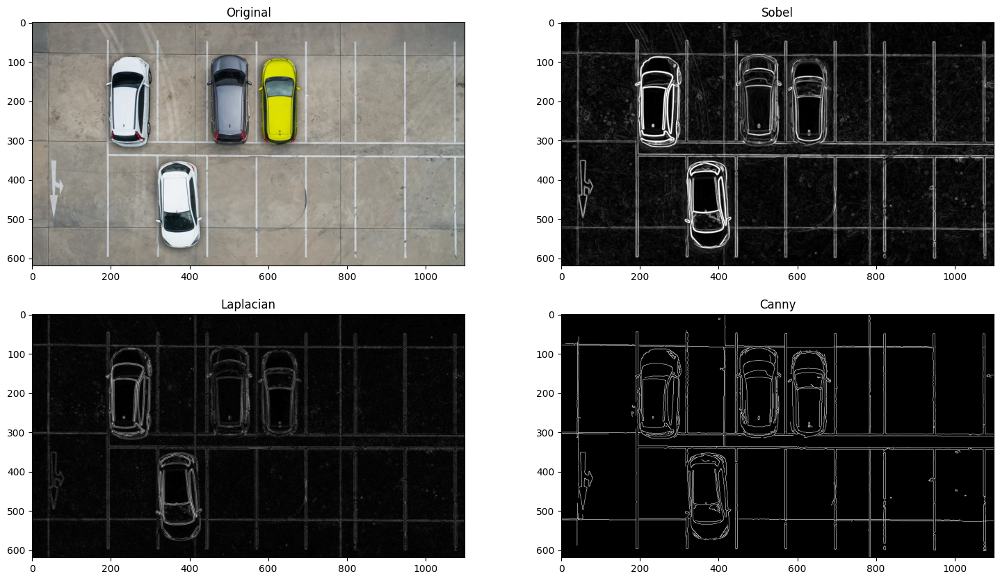

In [ ]:
# 1. Muat gambar
img = plt.imread(os.path.join(base_path, 'car-park.jpg'))
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
img_blur = cv.GaussianBlur(img_gray, (5, 5), 0) # Reduksi noise [cite: 102, 129]

# 2. Sobel Edge Detection [cite: 72]
# Hitung gradien Gx dan Gy [cite: 75]
sobelx = cv.Sobel(img_blur, cv.CV_64F, 1, 0, ksize=3) # Gx
sobely = cv.Sobel(img_blur, cv.CV_64F, 0, 1, ksize=3) # Gy
sobel_combined = cv.magnitude(sobelx, sobely)
sobel_combined = cv.convertScaleAbs(sobel_combined)

# 3. Laplacian Edge Detection [cite: 94]
laplacian = cv.Laplacian(img_blur, cv.CV_64F)
laplacian = cv.convertScaleAbs(laplacian)

# 4. Canny Edge Detection [cite: 127]
canny = cv.Canny(img_blur, 50, 150) # Gunakan 2 threshold [cite: 146]

# 5. Tampilkan semua hasil
plt.figure(figsize=(18, 10))
plt.subplot(2, 2, 1), plt.imshow(img), plt.title('Original')
plt.subplot(2, 2, 2), plt.imshow(sobel_combined, cmap='gray'), plt.title('Sobel')
plt.subplot(2, 2, 3), plt.imshow(laplacian, cmap='gray'), plt.title('Laplacian')
plt.subplot(2, 2, 4), plt.imshow(canny, cmap='gray'), plt.title('Canny')
plt.show()

## Tugas 5: Corner Detection (Harris & Shi-Tomasi)

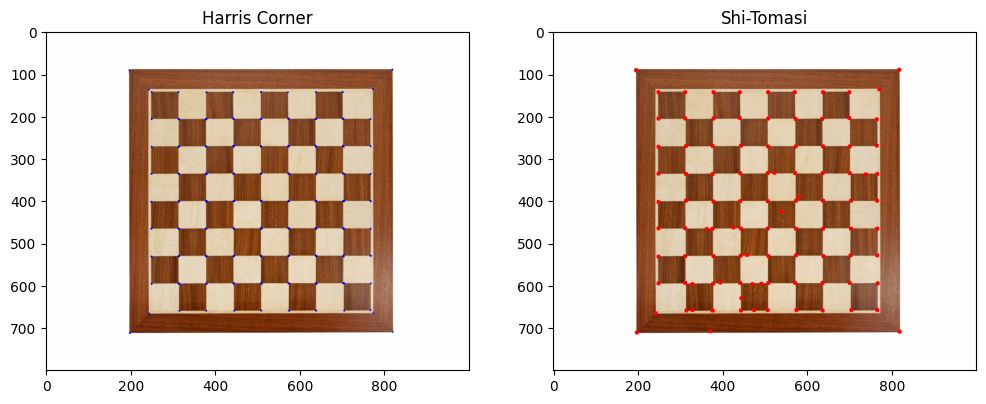

In [ ]:
# 1. Muat gambar
img = plt.imread(os.path.join(base_path, 'chess-board.jpg'))
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
img_gray_float = np.float32(img_gray) # Harris butuh float32

# --- Harris Corner Detection ---
img_harris = img.copy()
dst = cv.cornerHarris(img_gray_float, 2, 3, 0.04)
# Dilasi untuk menandai sudut
dst = cv.dilate(dst, None)
# Terapkan threshold dan gambar lingkaran
img_harris[dst > 0.01 * dst.max()] = [0, 0, 255] # Tandai dengan warna biru

# --- Shi-Tomasi Corner Detection ---
img_shi = img.copy()
corners = cv.goodFeaturesToTrack(img_gray, maxCorners=100, qualityLevel=0.01, minDistance=10)
corners = corners.astype(int)

for i in corners:
    x, y = i.ravel()
    cv.circle(img_shi, (x, y), 5, (255, 0, 0), -1) # Tandai dengan lingkaran merah

# Tampilkan hasil
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1), plt.imshow(img_harris), plt.title('Harris Corner')
plt.subplot(1, 2, 2), plt.imshow(img_shi), plt.title('Shi-Tomasi')
plt.show()

## Tugas 6: Grid Detection (Hough Transform)

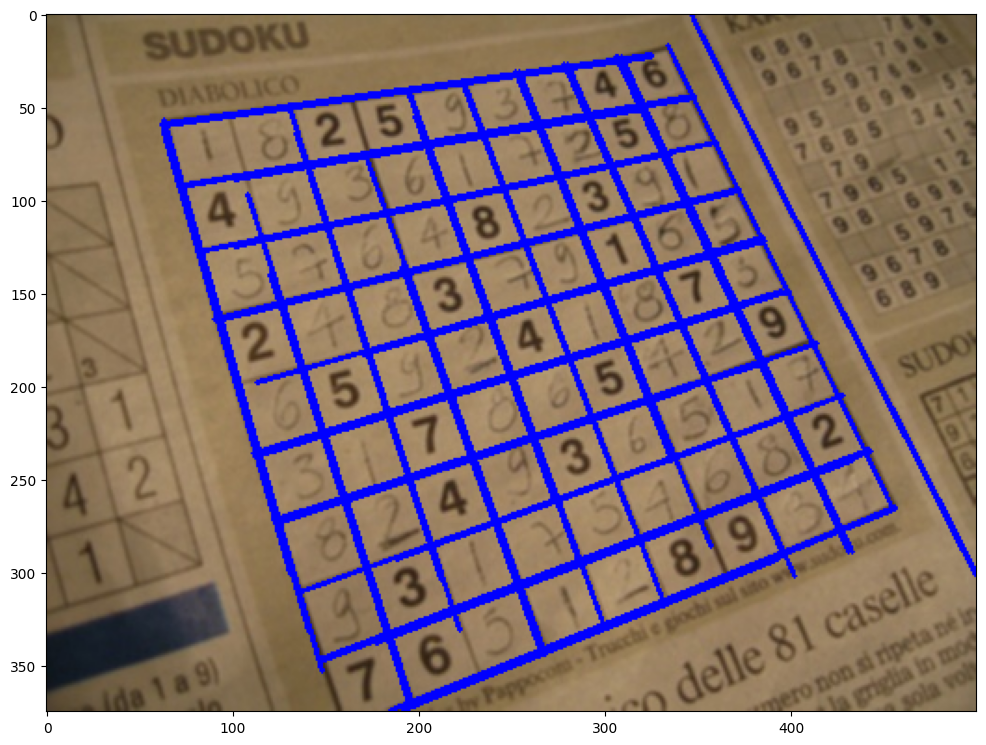

In [ ]:
# 1. Muat gambar
img = plt.imread(os.path.join(base_path, 'sudoku.jpg'))
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
img_draw = img.copy()

# 2. Terapkan Canny
edges = cv.Canny(img_gray, 50, 150, apertureSize=3)

# 3. Dilasi dan Erosi
kernel = np.ones((3,3), np.uint8)
edges = cv.dilate(edges, kernel, iterations=1)
edges = cv.erode(edges, kernel, iterations=1)

# 4. Terapkan HoughLinesP dengan parameter SUPER KETAT
# threshold: Naikkan dari 120 -> 130
# minLineLength: Naikkan dari 150 -> 200 (harus sangat panjang)
# maxLineGap: Turunkan dari 10 -> 5 (harus lebih nyambung/tidak putus)
linesP = cv.HoughLinesP(edges, 1, np.pi / 180,
                       threshold=130,
                       minLineLength=200,
                       maxLineGap=5)

# 5. Gambar segmen garis yang terdeteksi
if linesP is not None:
    for line in linesP:
        x1, y1, x2, y2 = line[0]
        cv.line(img_draw, (x1, y1), (x2, y2), (0, 0, 255), 2)

display(img_draw)

## Tugas 7: Contour Detection

Ditemukan 265 kontur.


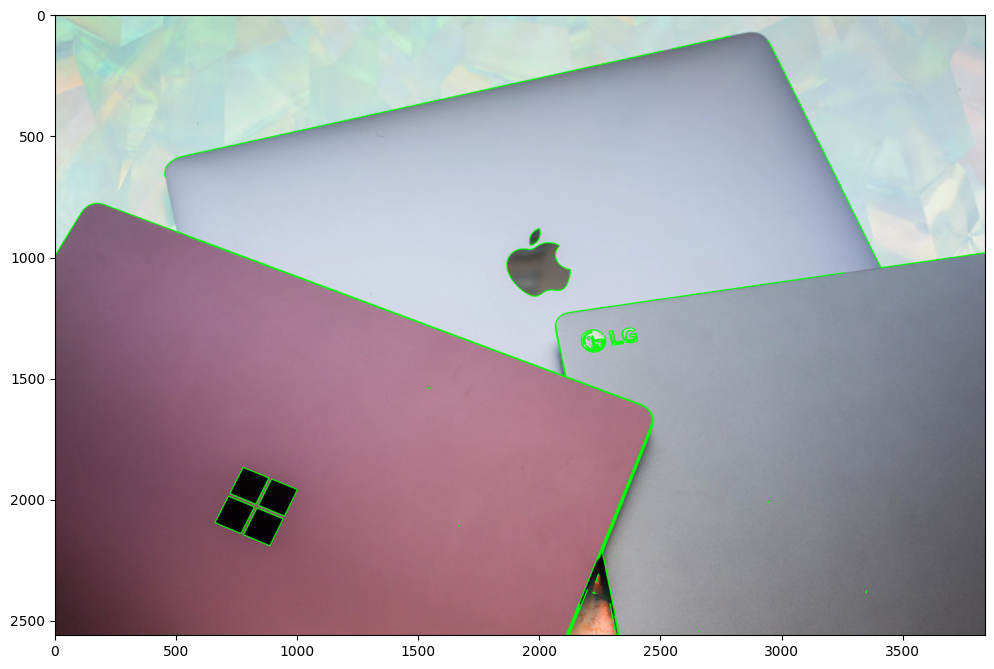

In [ ]:
# 1. Muat gambar
img = plt.imread(os.path.join(base_path, 'laptop.jpg'))
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# 2. Binerisasi (menggunakan Canny seperti saran modul [cite: 277])
canny_edges = cv.Canny(img_gray, 100, 200)

# 3. Temukan kontur [cite: 278]
# cv.RETR_EXTERNAL = hanya kontur terluar
# cv.CHAIN_APPROX_SIMPLE = kompresi segmen garis [cite: 286, 288]
contours, hierarchy = cv.findContours(canny_edges, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
print(f"Ditemukan {len(contours)} kontur.")

# 4. Gambar kontur [cite: 279]
img_contours = img.copy()
# -1 berarti gambar semua kontur
cv.drawContours(img_contours, contours, -1, (0, 255, 0), 3)

# 5. Tampilkan hasil
display(img_contours)

## D2. Praktikum Feature Matching dan Face Detection

--- Menjalankan D2.1: Deteksi Wajah Ganda ---
Hasil deteksi pada: kartini.jpg
Hasil deteksi pada: kucing.jpg
Hasil deteksi pada: jokowi.jpg
Hasil deteksi pada: mjordan.jpg
Hasil deteksi pada: solvayconf.jpg
Hasil deteksi pada: mask.png


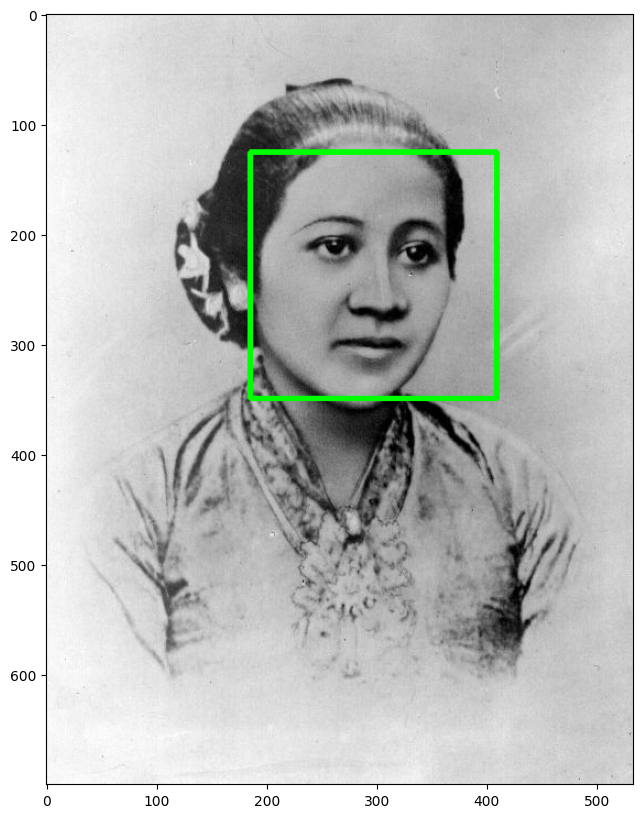

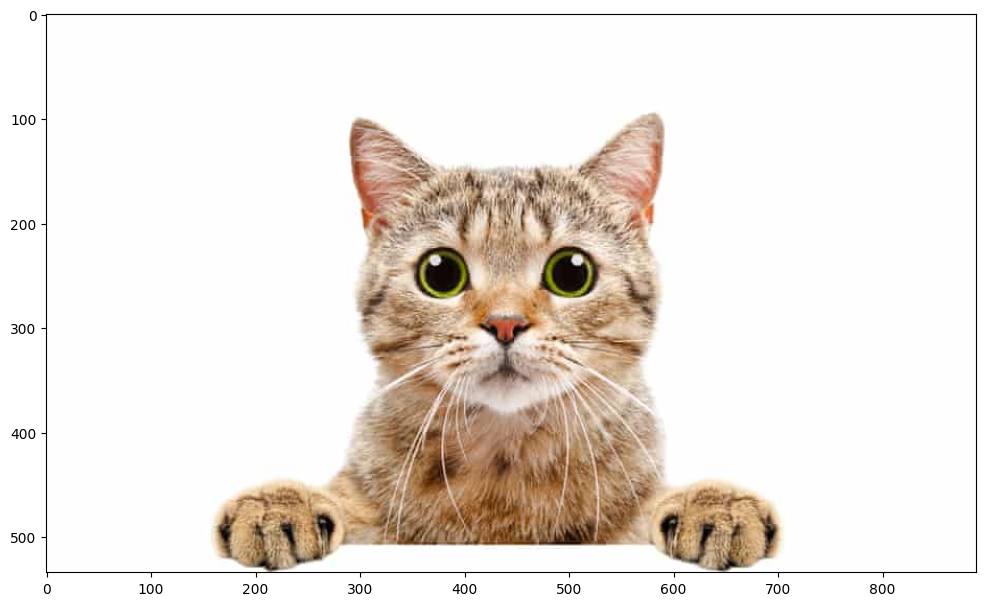

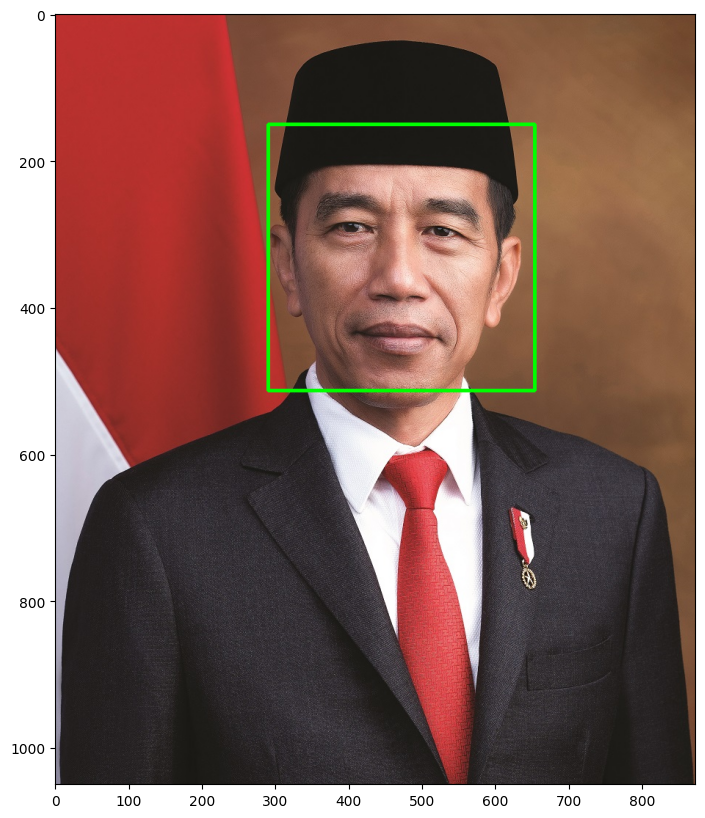

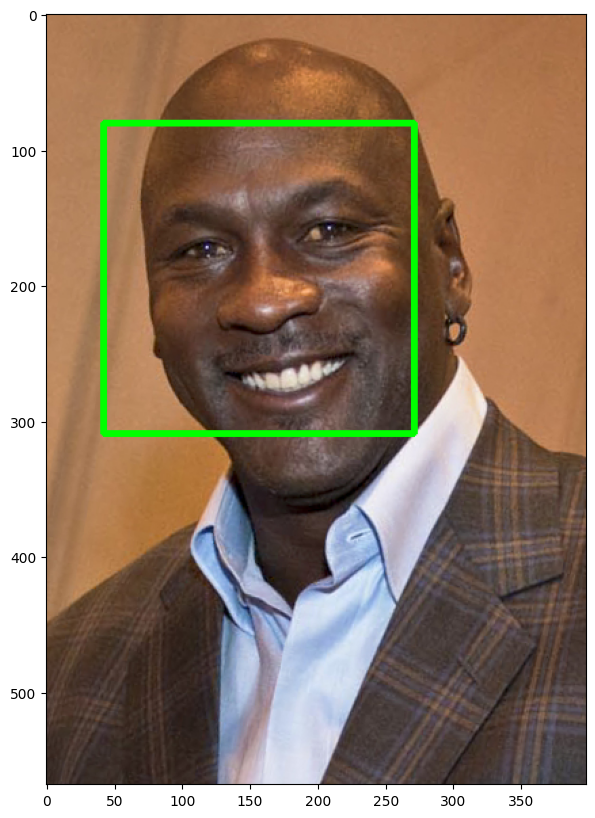

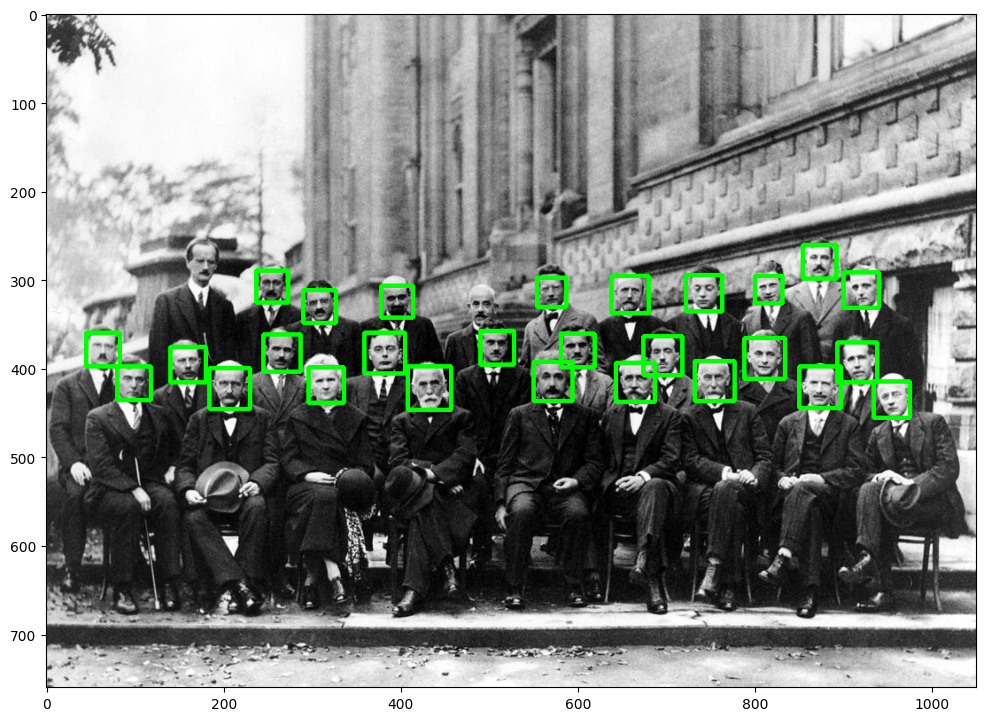

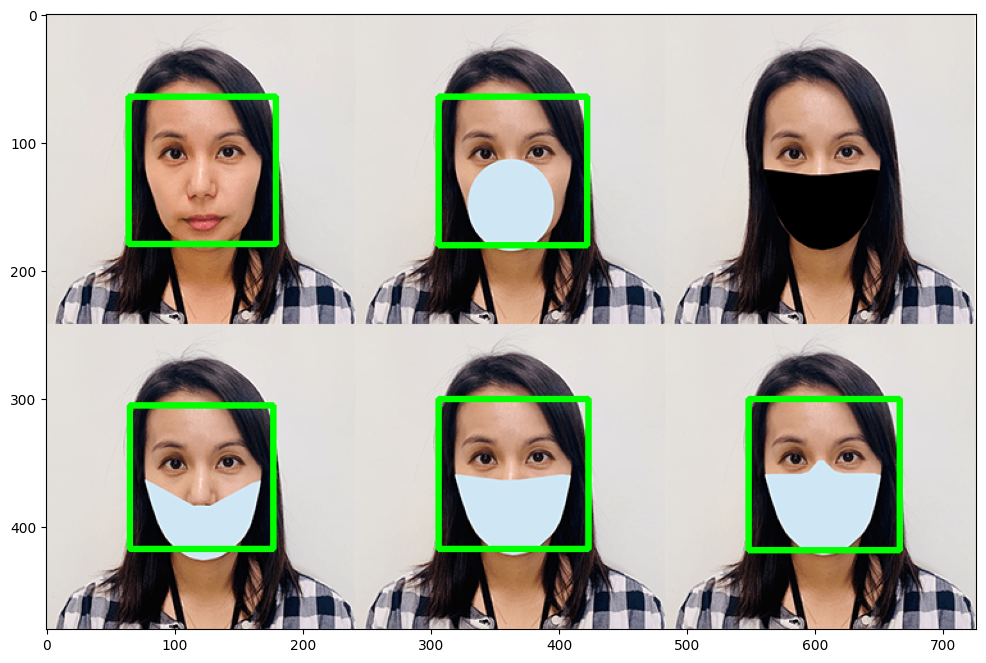

In [ ]:
# --- D2.1: Face Detection untuk image object lain ---
#

# Daftar gambar yang akan dideteksi (selain prabowo.jpg yang sudah ada di contoh)
# Sesuaikan nama file jika berbeda di folder Anda.
image_files = ['kartini.jpg', 'kucing.jpg', 'jokowi.jpg', 'mjordan.jpg', 'solvayconf.jpg', 'mask.png']

# Path ke cascade classifier untuk wajah
face_cascade_path = os.path.join(haarcascades_path, 'haarcascade_frontalface_alt.xml')
face_cascade = cv.CascadeClassifier(face_cascade_path)

# Tambahkan pemeriksaan apakah cascade classifier berhasil dimuat
if face_cascade.empty():
    print(f"Error: Gagal memuat file cascade: {face_cascade_path}")
    print("Pastikan folder 'haarcascades' ada di lokasi yang benar dan berisi file XML.")
    # Hentikan eksekusi jika cascade tidak dapat dimuat
    raise SystemExit("Cascade classifier tidak dapat dimuat.")

print("--- Menjalankan D2.1: Deteksi Wajah Ganda ---")
for file_name in image_files:
    # Buat path lengkap ke gambar
    img_path = os.path.join(facedet_path, file_name)

    # Baca gambar dalam grayscale [cite: 492]
    img_gray = cv.imread(img_path, 0)

    # Baca gambar berwarna untuk ditampilkan
    img_color = cv.imread(img_path)

    # Tambahkan pemeriksaan yang lebih robust untuk gambar yang gagal dimuat
    if img_gray is None or img_gray.size == 0:
        print(f"Gagal memuat gambar grayscale atau gambar kosong: {img_path}")
        continue
    if img_color is None or img_color.size == 0:
        print(f"Gagal memuat gambar berwarna atau gambar kosong: {img_path}")
        continue

    img_color = cv.cvtColor(img_color, cv.COLOR_BGR2RGB) # Konversi BGR ke RGB untuk Matplotlib

    # Deteksi wajah [cite: 492]
    # (scaleFactor dan minNeighbors ditambahkan untuk hasil lebih baik)
    faces = face_cascade.detectMultiScale(img_gray, scaleFactor=1.1, minNeighbors=5)

    # Gambar kotak di setiap wajah yang terdeteksi [cite: 493, 496]
    for (x, y, w, h) in faces:
        cv.rectangle(img_color, (x, y), (x + w, y + h), (0, 255, 0), 3) # Kotak hijau tebal

    # Tampilkan hasilnya
    print(f"Hasil deteksi pada: {file_name}")
    show_image(img_color, cmap=None) # Menggunakan show_image untuk menampilkan gambar berwarna



--- Menjalankan D2.2: Deteksi Wajah Kucing ---
Hasil deteksi wajah kucing:


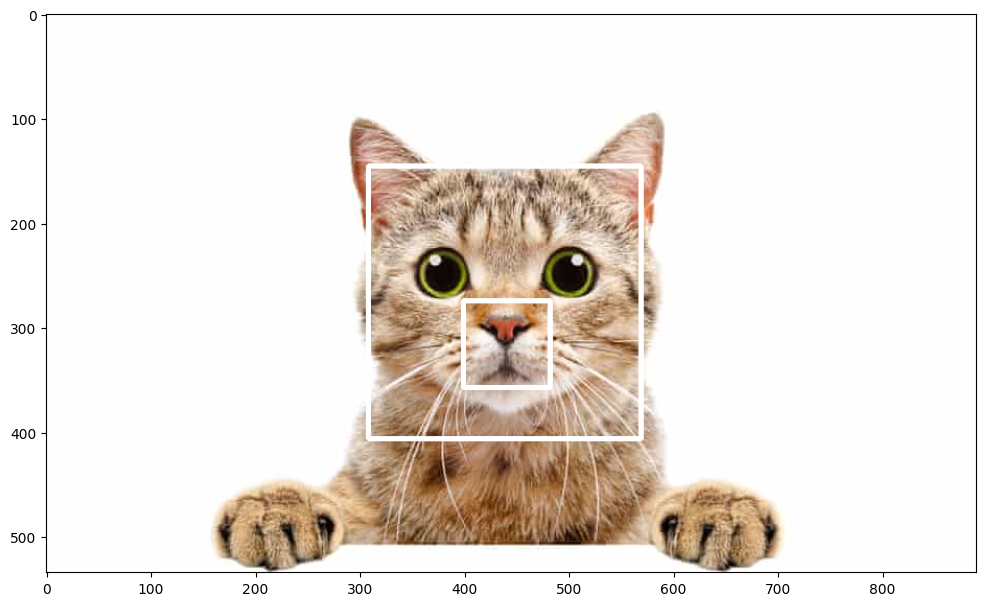

In [27]:
# --- D2.2: Deteksi Wajah Kucing ---
# [cite: 732, 733]

print("\n--- Menjalankan D2.2: Deteksi Wajah Kucing ---")

# Path ke cascade classifier untuk wajah KUCING
# (Nama file bisa bervariasi, misal 'haarcascade_frontalcatface.xml' atau 'haarcascade_frontalcatface_extended.xml')
cat_cascade_path = os.path.join(haarcascades_path, 'haarcascade_frontalcatface.xml')
cat_cascade = cv.CascadeClassifier(cat_cascade_path)

# Path ke gambar kucing
cat_img_path = os.path.join(facedet_path, 'kucing.jpg')

# Baca gambar
cat_gray = cv.imread(cat_img_path, 0)
cat_color = cv.imread(cat_img_path)
cat_color = cv.cvtColor(cat_color, cv.COLOR_BGR2RGB)

if cat_gray is None:
    print(f"Gagal memuat gambar: {cat_img_path}")
else:
    # Deteksi wajah kucing
    cat_faces = cat_cascade.detectMultiScale(cat_gray, scaleFactor=1.1, minNeighbors=3)

    # Gambar kotak
    for (x, y, w, h) in cat_faces:
        cv.rectangle(cat_color, (x, y), (x + w, y + h), (255, 255, 255), 3) # Kotak putih

    print(f"Hasil deteksi wajah kucing:")
    show_image(cat_color, cmap=None)


--- Menjalankan D2.3: Deteksi Mata ---
Hasil deteksi mata (Prabowo):


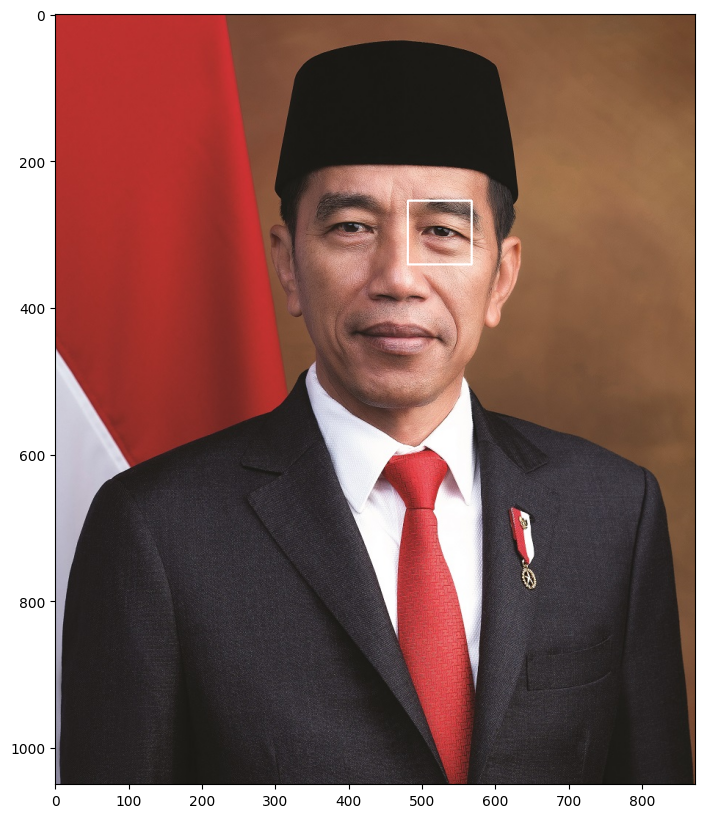

In [29]:
# --- D2.3: Deteksi Mata (Prabowo) ---
#

print("\n--- Menjalankan D2.3: Deteksi Mata ---")

# Path ke cascade classifier untuk MATA
eye_cascade_path = os.path.join(haarcascades_path, 'haarcascade_eye.xml')
eye_cascade = cv.CascadeClassifier(eye_cascade_path)

# Path ke gambar prabowo
prabowo_img_path = os.path.join(facedet_path, 'jokowi.jpg')

# Baca gambar
prabowo_gray = cv.imread(prabowo_img_path, 0)
prabowo_color = cv.imread(prabowo_img_path)
prabowo_color = cv.cvtColor(prabowo_color, cv.COLOR_BGR2RGB)

if prabowo_gray is None:
    print(f"Gagal memuat gambar: {prabowo_img_path}")
else:
    # Deteksi mata
    eyes = eye_cascade.detectMultiScale(prabowo_gray, scaleFactor=1.1, minNeighbors=10)

    # Gambar kotak
    for (x, y, w, h) in eyes:
        cv.rectangle(prabowo_color, (x, y), (x + w, y + h), (255, 255, 255), 2) # Kotak putih

    print(f"Hasil deteksi mata (Prabowo):")
    show_image(prabowo_color, cmap=None) # Menggunakan show_image untuk menampilkan gambar berwarna


--- Menjalankan D2.4: Deteksi Senyuman ---
Hasil deteksi senyuman:


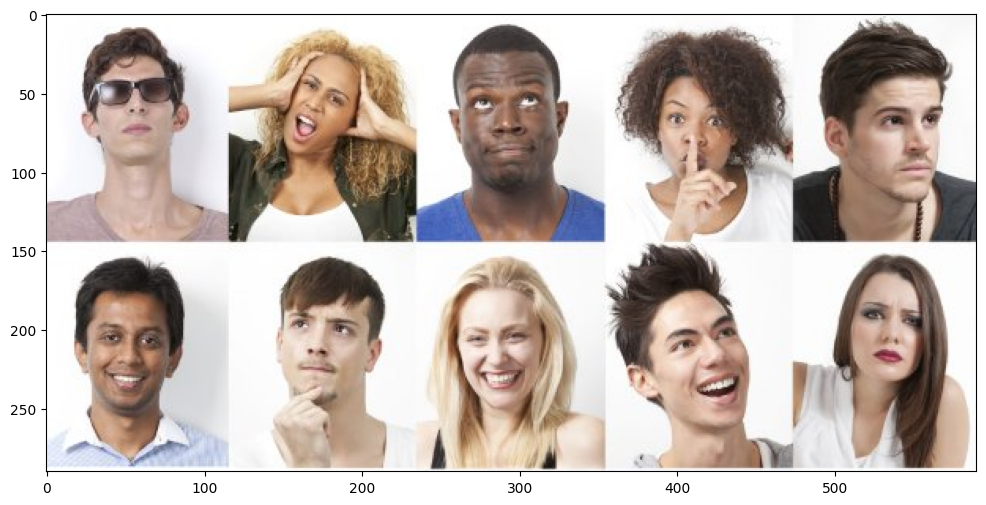

In [32]:
# --- D2.4: Deteksi Senyuman ---
#

print("\n--- Menjalankan D2.4: Deteksi Senyuman ---")

# Path ke cascade classifier untuk SENYUMAN
smile_cascade_path = os.path.join(haarcascades_path, 'haarcascade_smile.xml')
smile_cascade = cv.CascadeClassifier(smile_cascade_path)

# Path ke gambar people
people_img_path = os.path.join(facedet_path, 'FacialExpressions2.jpg')

# Baca gambar
people_gray = cv.imread(people_img_path, 0)
people_color = cv.imread(people_img_path)

# Tambahkan pemeriksaan yang lebih robust untuk gambar yang gagal dimuat
if people_gray is None or people_gray.size == 0:
    print(f"Error: Gagal memuat gambar grayscale atau gambar kosong: {people_img_path}")
elif people_color is None or people_color.size == 0:
    print(f"Error: Gagal memuat gambar berwarna atau gambar kosong: {people_img_path}")
else:
    people_color = cv.cvtColor(people_color, cv.COLOR_BGR2RGB)

    # Deteksi senyuman
    # (Parameter minNeighbors dan scaleFactor mungkin perlu disesuaikan
    #  agar lebih akurat dan mengurangi false positive)
    smiles = smile_cascade.detectMultiScale(people_gray, scaleFactor=1.3, minNeighbors=20)

    # Gambar kotak
    for (x, y, w, h) in smiles:
        cv.rectangle(people_color, (x, y), (x + w, y + h), (0, 0, 255), 2) # Kotak biru

    print(f"Hasil deteksi senyuman:")
    show_image(people_color, cmap=None) # Menggunakan show_image untuk menampilkan gambar berwarna

In [55]:
# === BLOK 1: IMPOR LIBRARY ===
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time

# === BLOK 2: FUNGSI HELPER DAN MODEL ===

# Fungsi untuk konversi JS object ke gambar OpenCV
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)
  return img

# Fungsi untuk konversi bounding box OpenCV ke byte string base64
def bbox_to_bytes(bbox_array):
  """
  Params:
          bbox_array: Numpy array (pixels) containing rectangle to overlay on video stream.
  Returns:
        bytes: Base64 image byte string
  """
  # convert array into PIL image
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()
  # format bbox into png for return
  bbox_PIL.save(iobuf, format='png')
  # format return string
  bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))
  return bbox_bytes

# Inisialisasi model Haar Cascade face detection
face_cascade = cv2.CascadeClassifier(cv2.samples.findFile(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'))


# === BLOK 3: JAVASCRIPT + PYTHON LOOP (Live Tracking + Tombol Capture) ===

# --- Definisi Fungsi JavaScript dan Python ---

def video_stream():
  js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;

    var pendingResolve = null;
    var shutdown = false;

    function removeDom() {
       if (stream) {
           stream.getVideoTracks()[0].stop();
       }
       if (video) {
           video.remove();
       }
       if (div) {
           div.remove();
       }
       video = null;
       div = null;
       stream = null;
       imgElement = null;
       captureCanvas = null;
       labelElement = null;
    }

    // Fungsi yang dipanggil setiap frame
    function onAnimationFrame() {
      if (shutdown) return; // Jika stop, jangan lakukan apa-apa

      window.requestAnimationFrame(onAnimationFrame); // Minta frame berikutnya

      if (pendingResolve) {
        var result_img = "";
        captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
        result_img = captureCanvas.toDataURL('image/jpeg', 0.8);

        var lp = pendingResolve;
        pendingResolve = null;
        // Kirim event 'frame'
        lp({img: result_img, event: 'frame'});
      }
    }

    // Fungsi untuk membuat elemen video dan DOM
    async function createDom() {
      if (div !== null) {
        return stream;
      }

      div = document.createElement('div');
      div.style.border = '2px solid black';
      div.style.padding = '3px';
      div.style.width = '100%';
      div.style.maxWidth = '600px';
      document.body.appendChild(div);

      const modelOut = document.createElement('div');
      modelOut.innerHTML = "<span>Status:</span>";
      labelElement = document.createElement('span');
      labelElement.innerText = 'Initializing...';
      labelElement.style.fontWeight = 'bold';
      modelOut.appendChild(labelElement);
      div.appendChild(modelOut);

      video = document.createElement('video');
      video.style.display = 'block';
      video.width = div.clientWidth - 6;
      video.setAttribute('playsinline', '');
      stream = await navigator.mediaDevices.getUserMedia(
          {video: { facingMode: "user"}});
      div.appendChild(video);

      imgElement = document.createElement('img');
      imgElement.style.position = 'absolute';
      imgElement.style.zIndex = 1;
      imgElement.style.pointerEvents = 'none'; // Biar bisa klik video di belakangnya
      div.appendChild(imgElement);

      // --- TOMBOL BARU ---
      const captureButton = document.createElement('button');
      captureButton.textContent = 'Capture';
      captureButton.style.margin = '5px';
      div.appendChild(captureButton);

      const stopButton = document.createElement('button');
      stopButton.textContent = 'Stop';
      stopButton.style.margin = '5px';
      div.appendChild(stopButton);
      // --- AKHIR TOMBOL BARU ---

      video.srcObject = stream;
      await video.play();

      captureCanvas = document.createElement('canvas');
      captureCanvas.width = 640; // Ukuran frame
      captureCanvas.height = 480; // Ukuran frame
      window.requestAnimationFrame(onAnimationFrame); // Mulai loop frame

      // --- EVENT HANDLER BARU ---
      captureButton.onclick = () => {
        if (pendingResolve) {
          // Ambil frame saat ini
          captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
          var result_img = captureCanvas.toDataURL('image/jpeg', 0.8);
          var lp = pendingResolve;
          pendingResolve = null;
          // Kirim event 'capture'
          lp({img: result_img, event: 'capture'});
        }
      };

      stopButton.onclick = () => {
        shutdown = true; // Set flag stop
        if (pendingResolve) {
          var lp = pendingResolve;
          pendingResolve = null;
          // Kirim event 'stop'
          lp({img: '', event: 'stop'});
        }
      };
      // --- AKHIR EVENT HANDLER ---

      return stream;
    }

    // Fungsi untuk streaming frame
    async function stream_frame(label, imgData) {
      if (shutdown) {
        removeDom();
        shutdown = false;
        return ''; // Kirim sinyal stop ke Python
      }

      var preCreate = Date.now();
      stream = await createDom();

      var preShow = Date.now();
      if (label != "") {
        labelElement.innerHTML = label;
      }

      if (imgData != "") {
        var videoRect = video.getClientRects()[0];
        imgElement.style.top = videoRect.top + "px";
        imgElement.style.left = videoRect.left + "px";
        imgElement.style.width = videoRect.width + "px";
        imgElement.style.height = videoRect.height + "px";
        imgElement.src = imgData;
      }

      var preCapture = Date.now();
      // Tunggu promise di-resolve oleh 'onAnimationFrame', 'captureButton', or 'stopButton'
      var result_obj = await new Promise(function(resolve, reject) {
        pendingResolve = resolve;
      });

      if (result_obj.event === 'stop') {
         shutdown = true; // Set flag shutdown jika event-nya stop
      }

      // Kirim balik object lengkap ke Python
      return {'create': preShow - preCreate,
              'show': preCapture - preShow,
              'capture': Date.now() - preCapture,
              'data': result_obj}; // 'data' berisi {img, event}
    }
    ''')

  display(js)

def video_frame(label, bbox):
  data = eval_js('stream_frame("{}", "{}")'.format(label, bbox))
  return data

# === MAIN LOOP (Live Tracking + Capture) ===

print("Memulai stream... Klik 'Capture' untuk mengambil foto, 'Stop' untuk berhenti.")

# 1. Mulai streaming video dari webcam
video_stream()

# 2. Siapkan label awal
label_html = 'Tracking...'

# 3. Inisialisasi bounding box (kotak) kosong
bbox = ''

# 4. Mulai loop
while True:
    # Dapatkan frame dari JavaScript
    js_reply = video_frame(label_html, bbox)

    # 1. Cek jika stream berhenti (JS kirim '')
    if not js_reply:
        print("Stream dihentikan.")
        break

    # 2. Ambil data event dari JS
    event_data = js_reply.get('data', {})
    event_type = event_data.get('event', 'frame')
    img_data = event_data.get('img', '')

    # 3. Handle event 'stop'
    if event_type == 'stop':
        print("Tombol stop ditekan.")
        continue # Loop lagi sekali, JS akan kirim '' dan menghentikan loop

    # 4. Handle jika tidak ada gambar
    if not img_data:
        continue

    # Konversi gambar
    img = js_to_image(img_data)

    # 5. Handle event 'capture'
    if event_type == 'capture':
        print("Gambar diambil!")
        # Simpan gambar
        cv2.imwrite('captured_photo.jpg', cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
        # Tampilkan gambar
        display(Image('captured_photo.jpg'))

        # --- PERBAIKAN DI SINI ---
        # Beri jeda 0.5 detik agar Colab sempat menampilkan gambar
        # sebelum loop lanjut meminta frame baru.
        time.sleep(0.5)

        # Jangan update bbox, langsung lanjut ke frame berikutnya
        continue

    # 6. Handle event 'frame' (default)
    label_html = 'Tracking...'

    # Buat overlay transparan untuk bounding box
    bbox_array = np.zeros([480,640,4], dtype=np.uint8)

    # Konversi ke grayscale untuk deteksi wajah
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Dapatkan koordinat wilayah wajah
    faces = face_cascade.detectMultiScale(gray, 1.1, 5) # (img, scaleFactor, minNeighbors)

    # Gambar kotak di wajah
    for (x,y,w,h) in faces:
      bbox_array = cv2.rectangle(bbox_array,(x,y),(x+w,y+h),(255,0,0),2) # Kotak biru

    # Atur transparansi
    bbox_array[:,:,3] = (bbox_array.max(axis = 2) > 0 ).astype(int) * 255

    # Konversi overlay bbox ke bytes
    bbox_bytes = bbox_to_bytes(bbox_array)

    # Update bbox untuk frame selanjutnya
    bbox = bbox_bytes

Memulai stream... Klik 'Capture' untuk mengambil foto, 'Stop' untuk berhenti.


<IPython.core.display.Javascript object>

/tmp/ipython-input-3363983383.py:39: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')


Stream dihentikan.


--- Menjalankan D2.6: Blurring Wajah (Jordan) ---
Hasil Blurring Wajah:


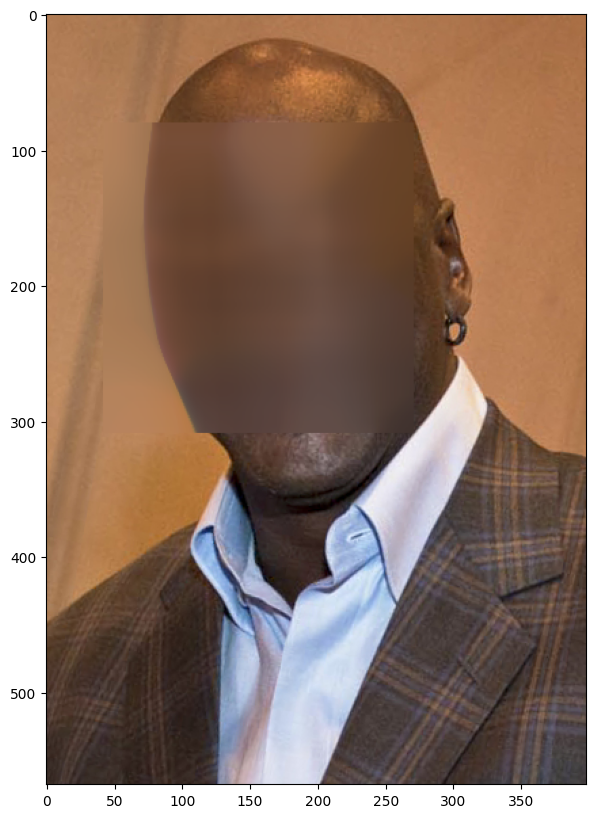

In [58]:
# --- D2.6: Blurring pada bagian wajah yang terdeteksi ---
#

print("--- Menjalankan D2.6: Blurring Wajah (Jordan) ---")

# 1. Tentukan Path
img_path = os.path.join(facedet_path, 'mjordan.jpg')
face_cascade_path = os.path.join(haarcascades_path, 'haarcascade_frontalface_alt.xml')

# 2. Muat Cascade Classifier
face_cascade = cv.CascadeClassifier(face_cascade_path)

# 3. Baca gambar (grayscale untuk deteksi, color untuk di-blur)
img_gray = cv.imread(img_path, 0)
img_color = cv.imread(img_path)

# Tambahkan pemeriksaan yang lebih robust untuk gambar yang gagal dimuat
if img_gray is None or img_gray.size == 0:
    print(f"Error: Gagal memuat gambar grayscale atau gambar kosong: {img_path}")
elif img_color is None or img_color.size == 0:
    print(f"Error: Gagal memuat gambar berwarna atau gambar kosong: {img_path}")
else:
    img_color = cv.cvtColor(img_color, cv.COLOR_BGR2RGB) # Konversi untuk display

    # 4. Deteksi wajah
    faces = face_cascade.detectMultiScale(img_gray, scaleFactor=1.1, minNeighbors=5)

    # 5. Loop setiap wajah, ekstrak ROI, dan blur
    for (x, y, w, h) in faces:
        # Tentukan Region of Interest (ROI) / area wajah
        face_roi = img_color[y:y+h, x:x+w]

        # Terapkan Median Blur pada ROI
        # Kernel size (ksize) harus ganjil. Semakin besar angkanya, semakin blur.
        ksize = 99
        blurred_face = cv.medianBlur(face_roi, ksize)

        # Ganti area wajah di gambar asli dengan versi yang sudah di-blur
        img_color[y:y+h, x:x+w] = blurred_face

    # 6. Tampilkan hasilnya
    print("Hasil Blurring Wajah:")
    show_image(img_color, cmap=None)

--- Menjalankan D2.7.b: Ekstraksi Foto KTM ---
Foto dari KTM berhasil diekstraksi:


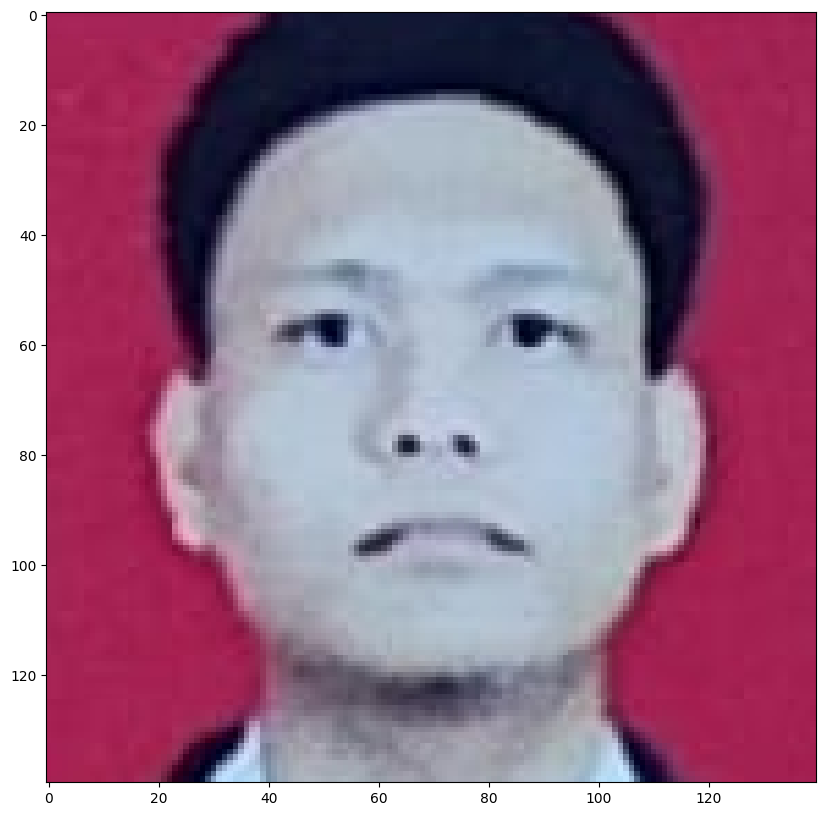

In [65]:
# --- D2.7.b: Menampilkan Foto dari KTM ---
#

print("--- Menjalankan D2.7.b: Ekstraksi Foto KTM ---")

# --- PASTIKAN PATH INI BENAR ---
# Ganti 'my_ktm.jpg' dengan nama file KTM kamu
ktm_image_path = os.path.join(base_path, 'KTM.jpeg')

# Path ke cascade classifier (masih sama)
face_cascade_path = os.path.join(haarcascades_path, 'haarcascade_frontalface_alt.xml')
face_cascade = cv.CascadeClassifier(face_cascade_path)

# Baca gambar
ktm_gray = cv.imread(ktm_image_path, 0)

if ktm_gray is None:
    print(f"Gagal memuat gambar: {ktm_image_path}")
    print("Pastikan file sudah di-upload dan path-nya benar.")
else:
    ktm_color = cv.cvtColor(cv.imread(ktm_image_path), cv.COLOR_BGR2RGB)

    # Deteksi wajah di KTM
    faces = face_cascade.detectMultiScale(ktm_gray, scaleFactor=1.1, minNeighbors=5)

    if len(faces) > 0:
        # Ambil wajah pertama yang terdeteksi
        (x, y, w, h) = faces[0]

        # Crop foto dari gambar KTM
        # Kita beri sedikit padding (area tambahan) agar tidak terlalu mepet
        padding = 20
        y1 = max(0, y - padding)
        y2 = min(ktm_color.shape[0], y + h + padding)
        x1 = max(0, x - padding)
        x2 = min(ktm_color.shape[1], x + w + padding)

        photo_crop = ktm_color[y1:y2, x1:x2]

        print(f"Foto dari KTM berhasil diekstraksi:")
        show_image(photo_crop, cmap=None)
    else:
        print("Wajah tidak terdeteksi di gambar KTM. Coba sesuaikan parameter detectMultiScale.")


--- Menjalankan D2.7.c: Feature Matching (SIFT) ---
KTM terdeteksi di dalam gambar:


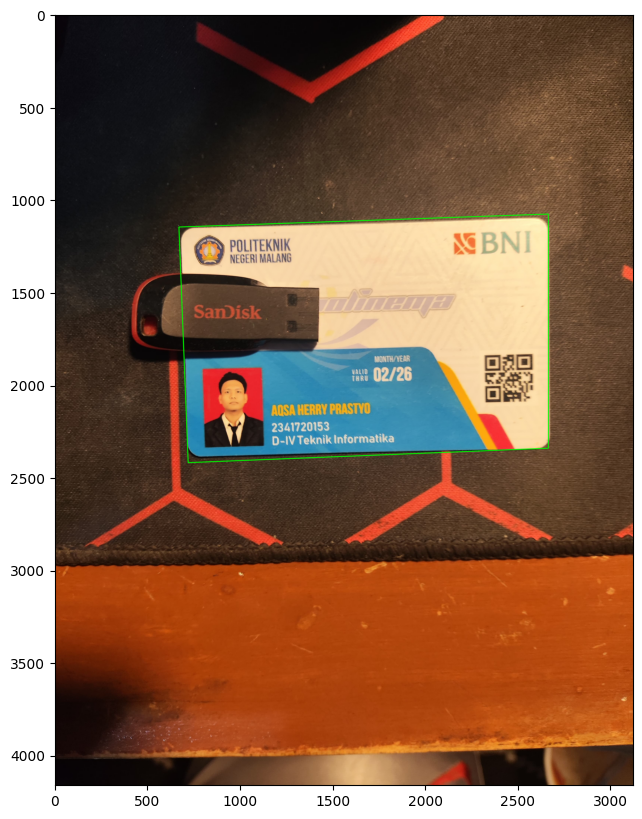

In [69]:
# --- D2.7.c: Deteksi Obyek KTM (Feature Matching) ---
#

print("\n--- Menjalankan D2.7.c: Feature Matching (SIFT) ---")

# --- PASTIKAN PATH INI BENAR ---
# 'my_ktm.jpg' adalah gambar template
template_path = os.path.join(base_path, 'KTM.jpeg')
# 'ktm_with_items.jpg' adalah gambar scene
scene_path = os.path.join(base_path, 'KTM_item.jpeg')

img_template = cv.imread(template_path, 0) # queryImage (grayscale)
img_scene_color = cv.imread(scene_path)    # trainImage (berwarna untuk output)

if img_template is None or img_scene_color is None:
    print("Gagal memuat gambar template atau scene.")
    print(f"Template path: {template_path}")
    print(f"Scene path: {scene_path}")
else:
    img_scene = cv.cvtColor(img_scene_color, cv.COLOR_BGR2GRAY) # trainImage (grayscale)
    img_scene_color = cv.cvtColor(img_scene_color, cv.COLOR_BGR2RGB) # Konversi untuk display

    try:
        # 1. Inisialisasi SIFT Detector
        sift = cv.SIFT_create()

        # 2. Temukan keypoints dan descriptors
        kp1, des1 = sift.detectAndCompute(img_template, None)
        kp2, des2 = sift.detectAndCompute(img_scene, None)

        # 3. Inisialisasi FLANN Matcher
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=50) # atau lebih tinggi
        flann = cv.FlannBasedMatcher(index_params, search_params)

        # 4. Temukan matches menggunakan k-NN
        matches = flann.knnMatch(des1, des2, k=2)

        # 5. Simpan semua good matches (Lowe's ratio test) [cite: 387-391]
        good_matches = []
        for m, n in matches:
            if m.distance < 0.7 * n.distance:
                good_matches.append(m)

        MIN_MATCH_COUNT = 10
        if len(good_matches) > MIN_MATCH_COUNT:
            # 6. Dapatkan koordinat keypoints
            src_pts = np.float32([ kp1[m.queryIdx].pt for m in good_matches ]).reshape(-1,1,2)
            dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good_matches ]).reshape(-1,1,2)

            # 7. Temukan Homography (transformasi perspektif)
            M, mask = cv.findHomography(src_pts, dst_pts, cv.RANSAC, 5.0)

            # 8. Gambar kotak di sekeliling obyek yang terdeteksi
            h, w = img_template.shape
            pts = np.float32([ [0,0], [0,h-1], [w-1,h-1], [w-1,0] ]).reshape(-1,1,2)
            dst = cv.perspectiveTransform(pts, M)

            # Gambar polylines di gambar scene berwarna
            img_scene_color = cv.polylines(img_scene_color, [np.int32(dst)], True, (0, 255, 0), 3, cv.LINE_AA)

            print(f"KTM terdeteksi di dalam gambar:")
            show_image(img_scene_color, cmap=None)

        else:
            print(f"Tidak cukup match ditemukan - {len(good_matches)}/{MIN_MATCH_COUNT}")

    except Exception as e:
        print(f"Error: {e}")
        print("Pastikan kamu sudah menginstal 'opencv-contrib-python'.")
        print("Jalankan: !pip install opencv-contrib-python")